# Group 9: House Price Prediction

## Members that contributed:

### Dylan McMaster
### Student Number: 578674

### Kyle McAdam
### Student Number: 578403

#  Data Import

In [1]:
#!pip install category_encoders

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
train_df = pd.read_csv('./train.csv')
test_df = pd.read_csv('./test.csv')
sample_submission_df = pd.read_csv('./sample_submission.csv')

# 1. Data Exploration

In [5]:
train_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [6]:
train_df.shape

(1460, 81)

<Axes: >

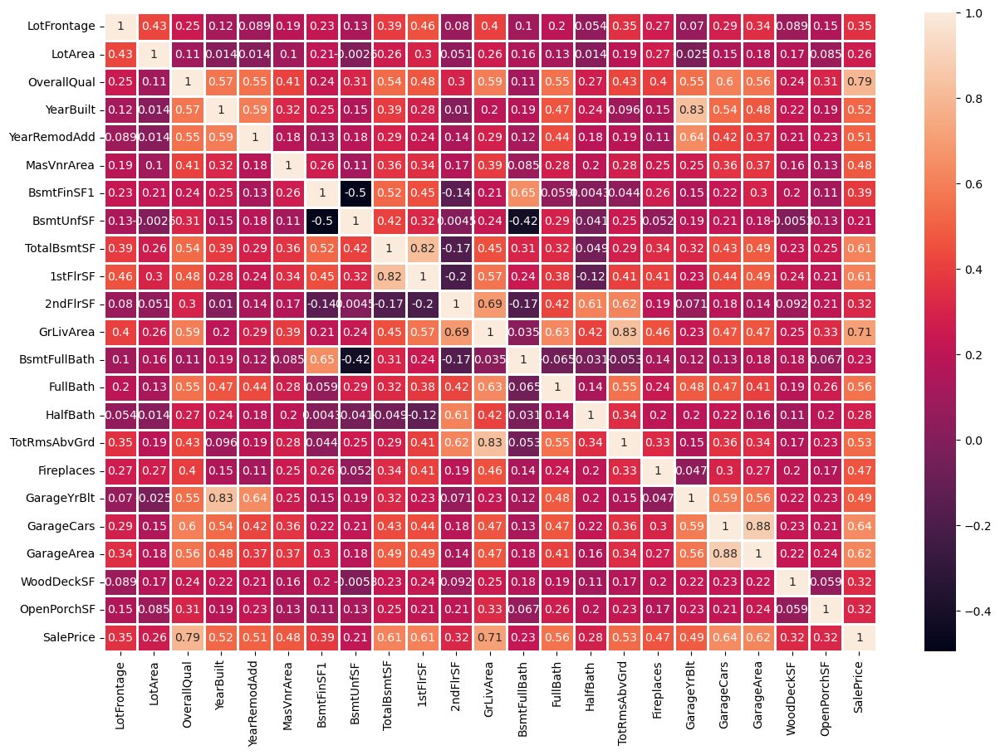

In [7]:
corr =train_df.corr(numeric_only=True)
high_corr=corr.index[abs(corr['SalePrice'])>0.2]
plt.figure(figsize=(15,10))
sns.heatmap(train_df[high_corr].corr(numeric_only=True), annot=True, linewidth=2)


In [8]:
test_df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [9]:
test_df.shape

(1459, 80)

### 1.1 Checking for missing values

Create missing data histogram for train data

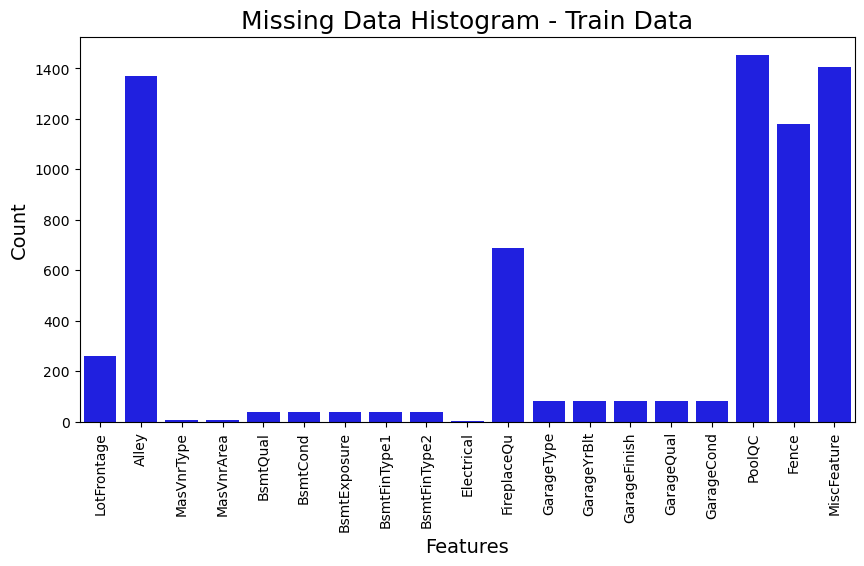

In [10]:
train_missing = train_df.isnull().sum()
train_missing = train_missing[train_missing > 0]
plt.figure(figsize=(10,5))
sns.barplot(x=train_missing.index, y=train_missing.values, color='blue')
plt.title('Missing Data Histogram - Train Data', fontsize=18)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=90)
plt.show()

Create missing data histogram for test data

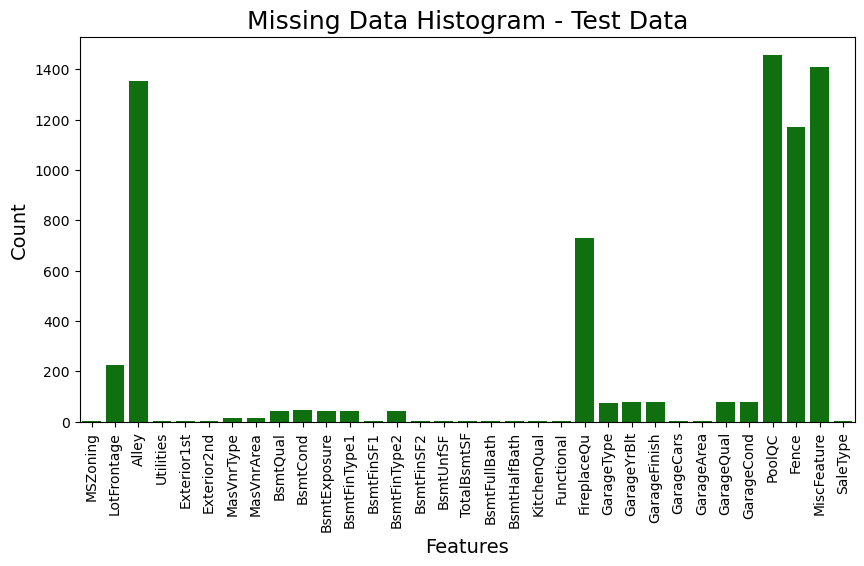

In [11]:
test_missing = test_df.isnull().sum()
test_missing = test_missing[test_missing > 0]
plt.figure(figsize=(10,5))
sns.barplot(x=test_missing.index, y=test_missing.values, color='green')
plt.title('Missing Data Histogram - Test Data', fontsize=18)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=90)
plt.show()

Show missing data of train data with percentage as table

In [12]:
total = train_df.isnull().sum().sort_values(ascending=False)
percent = (train_df.isnull().sum()/train_df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
PoolQC,1453,0.995205
MiscFeature,1406,0.963014
Alley,1369,0.937671
Fence,1179,0.807534
FireplaceQu,690,0.472603
LotFrontage,259,0.177397
GarageYrBlt,81,0.055479
GarageCond,81,0.055479
GarageType,81,0.055479
GarageFinish,81,0.055479


High amount of missing data but PoolQC5, MiscFeature, Alley are over 90% 

FireplaceQu is almost 50%

LotFrontage,
GarageYrBlt,
GarageCond,
GarageType,
GarageFinish,
GarageQual,
BsmtFinType2,
BsmtExposure,
BsmtQual,
BsmtCond,
BsmtFinType1,
MasVnrArea,
MasVnrType,
Electrical.

Are below 50% which is acceptable 

# 2. Data Preparation

### Here we will prepare that data by :Dropping data; viewing and filling Numerical and categorical data; checking and removing outliers; Encoding data; Appling Feature engineering

Dropping ID column in training data set as it is not needed

In [13]:
df_test = test_df.copy()
train_df = train_df.drop('Id', axis = 1)
test_df = test_df.drop('Id', axis = 1)

Drop columns with more than 50% missing values for trainning data

In [14]:
null_col = train_df.columns[train_df.isnull().any()]
null_train_df = train_df[null_col]
null_df = null_train_df.isnull().sum().sort_values(ascending=False)

In [15]:
null_train= round(null_train_df.isnull().sum().sort_values(ascending=False)/null_train_df.shape[0]*100,2)

In [16]:
col_to_drop_train=null_train[null_train>50].keys()
print(col_to_drop_train)
train_df=train_df.drop(col_to_drop_train, axis=1)

Index(['PoolQC', 'MiscFeature', 'Alley', 'Fence'], dtype='object')


Dropping the same columns as in train data

In [17]:
test_df=test_df.drop("Alley",axis=1)
test_df=test_df.drop("PoolQC",axis=1)
test_df=test_df.drop("Fence",axis=1)
test_df=test_df.drop("MiscFeature",axis=1)

### 2.1 Numerical and categorical

Number of numerical and categorical feats

In [18]:
numerical_feats = train_df.dtypes[train_df.dtypes != "object"].index
print("Number of Numerical features: ", len(numerical_feats))

categorical_feats = train_df.dtypes[train_df.dtypes == "object"].index
print("Number of Categorical features: ", len(categorical_feats))

Number of Numerical features:  37
Number of Categorical features:  39


Columns of Numerical and Categorical features with missing data:

In [19]:
obj_cols = train_df.select_dtypes(include='object').columns[train_df.select_dtypes(include='object').isnull().any()]
num_cols = train_df.select_dtypes(include=['float', 'int64']).columns[train_df.select_dtypes(include=['float', 'int64']).isnull().any()]

print('Train data')
print("Categorical columns are:")
print(obj_cols)
print('-----------------------------------------')
print('Numerical columns are:')
print(num_cols)

Train data
Categorical columns are:
Index(['MasVnrType', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1',
       'BsmtFinType2', 'Electrical', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond'],
      dtype='object')
-----------------------------------------
Numerical columns are:
Index(['LotFrontage', 'MasVnrArea', 'GarageYrBlt'], dtype='object')


In [20]:
obj_cols_test = test_df.select_dtypes(include='object').columns[test_df.select_dtypes(include='object').isnull().any()]
num_cols_test = test_df.select_dtypes(include=['float', 'int64']).columns[test_df.select_dtypes(include=['float', 'int64']).isnull().any()]
print('Test data')
print("Categorical columns are:")
print(obj_cols_test)
print('-----------------------------------------')
print('Numerical columns are:')
print(num_cols_test)

Test data
Categorical columns are:
Index(['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType',
       'GarageFinish', 'GarageQual', 'GarageCond', 'SaleType'],
      dtype='object')
-----------------------------------------
Numerical columns are:
Index(['LotFrontage', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt',
       'GarageCars', 'GarageArea'],
      dtype='object')


### After further inspection it was found that OverallQual and OverallCond should be categorical

Performing feature engineering on OverallQual and OverallCond

In [21]:
interval = (0.9, 1.9, 2.9, 3.9, 4.9, 5.9, 6.9, 7.9, 8.9, 9.9, 10.9)

cats = ['Very_Poor', 'Poor', 'Fair', 'Below_Average', 'Average', 'Above_Average', 'Good', 'Very_Good', 'Excellent', 'Very_Excellent']
train_df["OverallQual"] = pd.cut(train_df.OverallQual, interval, labels=cats)
test_df["OverallQual"] = pd.cut(test_df.OverallQual, interval, labels=cats)
train_df["OverallCond"] = pd.cut(train_df.OverallCond, interval, labels=cats)
test_df["OverallCond"] = pd.cut(test_df.OverallCond, interval, labels=cats)
train_df['OverallQual'] = train_df['OverallQual'].astype('object')
test_df['OverallQual'] = test_df['OverallQual'].astype('object')
train_df['OverallCond'] = train_df['OverallCond'].astype('object')
test_df['OverallCond'] = test_df['OverallCond'].astype('object')

### Filling in data for numerical and categorical data

* For numerical data we will be using the mean
* For categorical data we will be using the mode

Train Data (Numerical and Categorical)

In [22]:
from sklearn.impute import SimpleImputer

# Define the numerical and categorical columns
num_cols_train = num_cols
cat_cols_train = obj_cols

# Create imputers for numerical and categorical columns
num_imputer = SimpleImputer(strategy='mean')
obj_imputer = SimpleImputer(strategy='most_frequent')

# apply the imputer to the selected columns
train_df[num_cols_train] = num_imputer.fit_transform(train_df[num_cols_train])
train_df[cat_cols_train] = obj_imputer.fit_transform(train_df[cat_cols_train])

Test Data numerical

In [23]:
test_df["LotFrontage"] = test_df["LotFrontage"].fillna(test_df["LotFrontage"].mean())
test_df["MasVnrArea"] = test_df["MasVnrArea"].fillna(test_df["MasVnrArea"].mean())
test_df["GarageYrBlt"] = test_df["GarageYrBlt"].fillna(test_df["GarageYrBlt"].mean())
test_df["GarageCars"] = test_df["GarageCars"].fillna(0) # If no bathromms is mentioned then there are no bathrooms
test_df["GarageArea"] = test_df["GarageArea"].fillna(test_df["GarageArea"].mean())
test_df["BsmtFullBath"] = test_df["BsmtFullBath"].fillna(0)# If no basement full bathromms is mentioned then there are none
test_df["BsmtHalfBath"] = test_df["BsmtHalfBath"].fillna(0)# If no basement half bathromms is mentioned then there are none
test_df["BsmtFinSF1"] = test_df["BsmtFinSF1"].fillna(test_df["BsmtFinSF1"].mean())
test_df["BsmtFinSF2"] = test_df["BsmtFinSF2"].fillna(test_df["BsmtFinSF2"].mean())
test_df["TotalBsmtSF"] = test_df["TotalBsmtSF"].fillna(test_df["TotalBsmtSF"].mean())
test_df["BsmtUnfSF"] = test_df["BsmtUnfSF"].fillna(test_df["BsmtUnfSF"].mean())

### 2.2 Checking for outliers and removing outliers

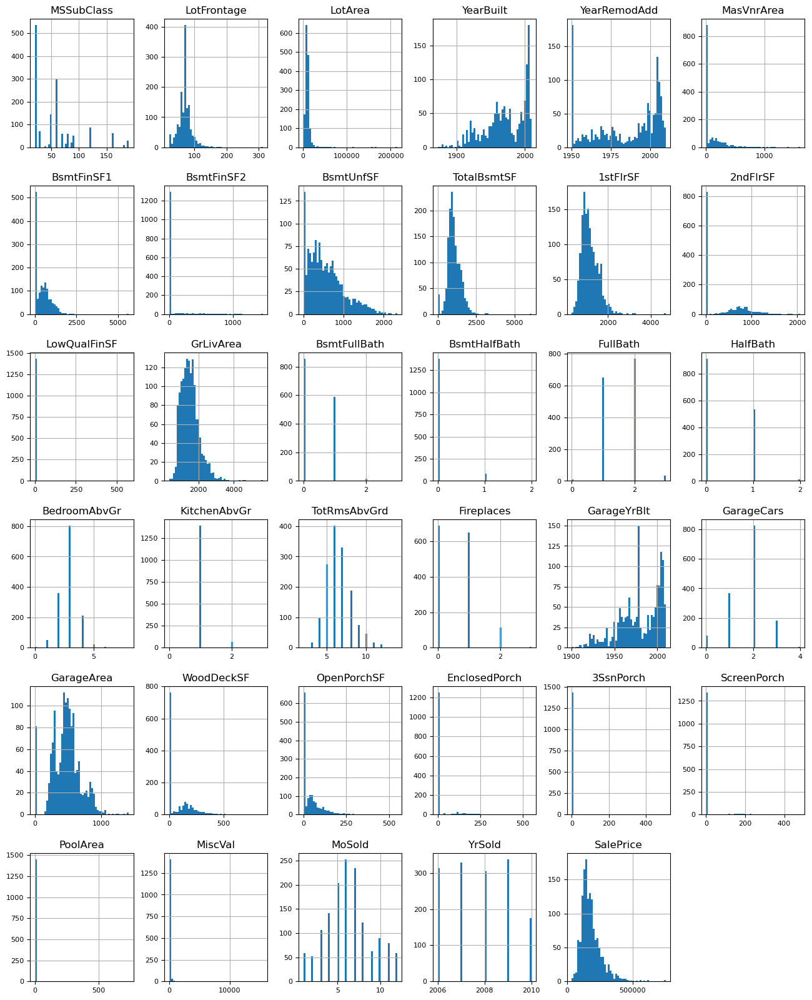

In [24]:
df_hist=train_df.select_dtypes(include=['float64','int64', 'object'])
df_hist.hist(figsize=(16,20),bins=50,xlabelsize=8,ylabelsize=8);

As seen by histograms the data are not all centered in the middle of a histogram, it means that there are outliers, extreme points skewing the data. This is why we must drop them

Remove outliers using the interquartile range (IQR) method for trainning data

In [25]:
num_cols = train_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    Q1 = train_df[col].quantile(0.25)
    Q3 = train_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    train_df = train_df[(train_df[col] >= lower_bound) & (train_df[col] <= upper_bound)]

Remove outliers using the interquartile range (IQR) method for test data

In [26]:
num_cols = test_df.select_dtypes(include=['int64', 'float64']).columns
for col in num_cols:
    Q1 = train_df[col].quantile(0.25)
    Q3 = train_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5*IQR
    upper_bound = Q3 + 1.5*IQR
    test_df = test_df[(test_df[col] >= lower_bound) & (test_df[col] <= upper_bound)]

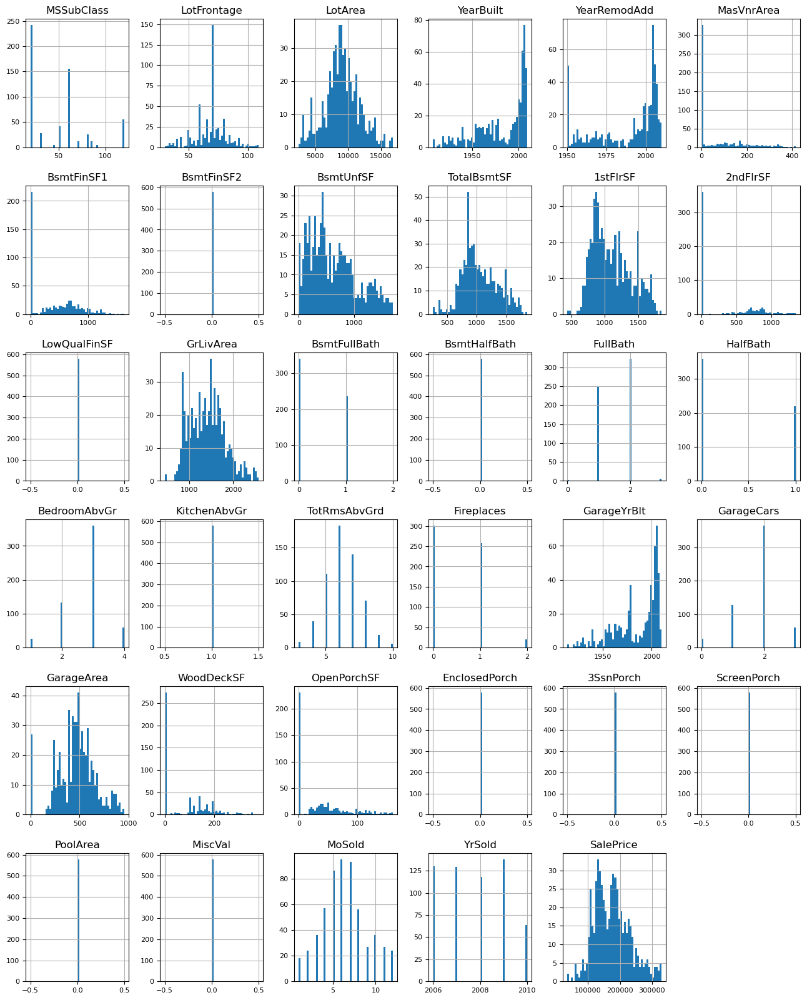

In [27]:
df_hist=train_df.select_dtypes(include=['float64','int64'])
df_hist.hist(figsize=(16,20),bins=50,xlabelsize=8,ylabelsize=8);

As seen by histograms the data is more centered in the middle of a histogram, it means that there are fewer outliers in the data. We removed the extreme points to make the data less skewed

In [28]:
train_df.shape

(579, 76)

Only 579 rows of data left from 1490 but trying to centre any more data will cause the historgrams to become more skew causing less acurate data

### 2.3 Encoding data

* Combining training and test data for more accurate training and Encode categorical variables using one-hot encoding
* To make encoding more uniform across tests.csv and train.csv datasets

In [29]:
concat_result = pd.concat([train_df, test_df])
concat_result=pd.get_dummies(concat_result,drop_first=True)

In [30]:
concat_result.shape

(1067, 210)

In [31]:
concat_result

,MSSubClass,LotFrontage,LotArea,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice,MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Pave,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_HLS,LandContour_Low,LandContour_Lvl,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Mod,LandSlope_Sev,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Feedr,Condition2_Norm,Condition2_PosN,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,OverallQual_Average,OverallQual_Below_Average,OverallQual_Excellent,OverallQual_Fair,OverallQual_Good,OverallQual_Poor,OverallQual_Very_Excellent,OverallQual_Very_Good,OverallQual_Very_Poor,OverallCond_Average,OverallCond_Below_Average,OverallCond_Excellent,OverallCond_Fair,OverallCond_Good,OverallCond_Poor,OverallCond_Very_Good,OverallCond_Very_Poor,RoofStyle_Gambrel,RoofStyle_Hip,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Fa,ExterCond_Gd,ExterCond_TA,Foundation_CBlock,Foundation_PConc,Foundation_Wood,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,Heating_GasW,Heating_Grav,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_TA,CentralAir_Y,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Typ,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,GarageType_Attchd,GarageType_Basment,GarageType_BuiltIn,GarageType_CarPort,GarageType_Detchd,GarageFinish_RFn,GarageFinish_Unf,GarageQual_Gd,GarageQual_Po,GarageQual_TA,GarageCond_Fa,GarageCond_Gd,GarageCond_Po,GarageCond_TA,PavedDrive_P,PavedDrive_Y,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_AdjLand,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,60,65.000000,8450,2003,2003,196.000000,706.0,0.0,150.0,856.0,856,854,0,1710,1.0,0.0,2,1,3,1,8,0,2003.000000,2.0,548.0,0,61,0,0,0,0,0,2,2008,208500.0,0,0,1,0,1,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,1,0
2,60,68.000000,11250,2001,2002,162.000000,486.0,0.0,434.0,920.0,920,866,0,1786,1.0,0.0,2,1,3,1,6,1,2001.000000,2.0,608.0,0,42,0,0,0,0,0

### Data correlation

Spliting concat_result back into the original dataframes(train_df, test_df)

In [32]:
train_df = concat_result.iloc[:len(train_df), :]
test_df = concat_result.iloc[len(train_df):len(train_df)+len(test_df), :]
test_df = test_df.drop('SalePrice', axis = 1)

In [33]:
test_df.shape

(488, 209)

In [34]:
train_df.shape

(579, 210)

<Axes: >

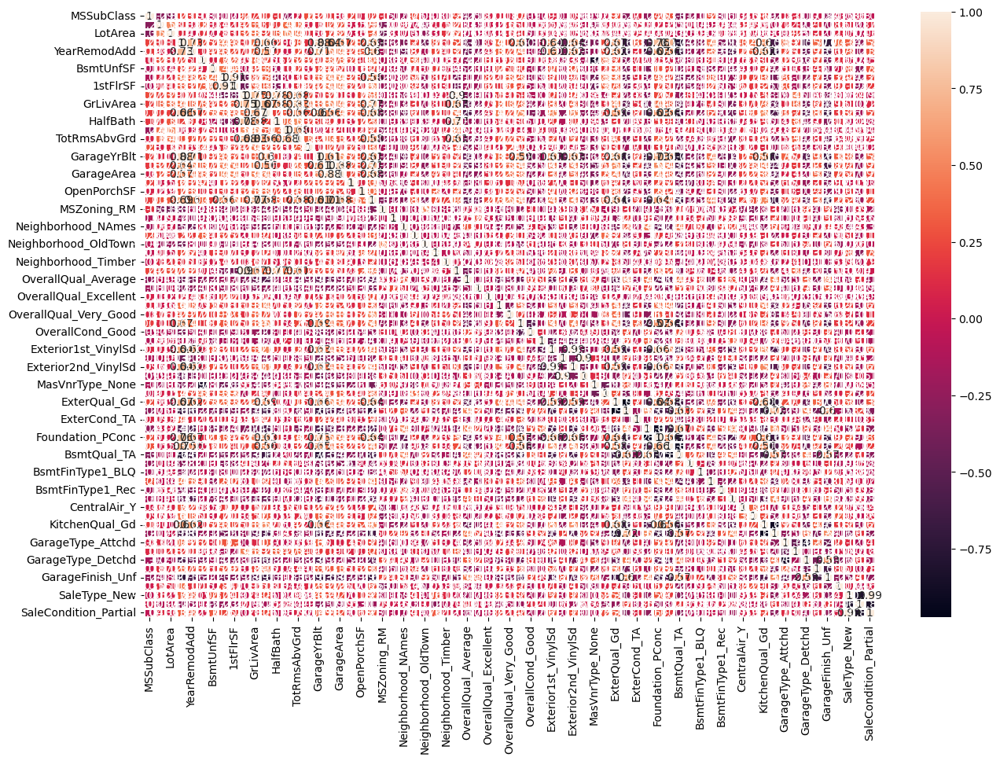

In [35]:
from sklearn.preprocessing import StandardScaler
corr =train_df.corr(numeric_only=True)
high_corr=corr.index[abs(corr['SalePrice'])>0.2]
plt.figure(figsize=(15,10))
sns.heatmap(train_df[high_corr].corr(numeric_only=True), annot=True, linewidth=2)

###  2.4 Split the dataset into training and testing sets And Standardization

In [36]:
from sklearn.model_selection import train_test_split
X = train_df[high_corr.drop('SalePrice')]
y = train_df['SalePrice']
test_df=test_df[high_corr.drop('SalePrice')]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)
test_df=sc.fit_transform(test_df)

# 3. Model Building & Results

We choose to use Ridge regression a variant of linear regression becuase we wanted to make use of GridSearchCV 
which is a function of Scikit-learn library that performs an exhaustive search over a specified parameter grid, 
to find the optimal set of hyperparameters for a given estimator and Ridge regresson has more hyperparameters 
which can be set for greater resluts.

For a better and more accurate ridge model we will be tunning hyperparameters using cross-validation with GridSearchCV then training the Ridge regression model with best hyperparameters
determined and finally using Recursive Feature Elimination to determine the most optimal feature for the best Ridge scores such as:
* The hight Accuracy score
* R^2
* Lowest mean_absolute_error
* Lowest mean_squared_error

This will help us to achieve the closest prediction to the actual data

## 3.1 Linear Regeression model

Import Libraries for models and metrics

In [37]:
from sklearn.linear_model import LinearRegression,Ridge
from sklearn import metrics
from math import sqrt
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error, mean_squared_error

Fit linear regression model to training data

In [38]:
linreg = LinearRegression()
linreg.fit(X_train, y_train)
linreg_y_pred = linreg.predict(X_test)
linreg_acc = round(linreg.score(X_test, y_test)*100,2)
linreg_r2 = round(r2_score(y_test, linreg_y_pred)*100,2)
linreg_mae = round(mean_absolute_error(y_test, linreg_y_pred),2)
linreg_mse = round(mean_squared_error(y_test, linreg_y_pred),2)
linreg_rmse = round(np.sqrt(linreg_mse),2)

### 3.1.1 Linear Regression model

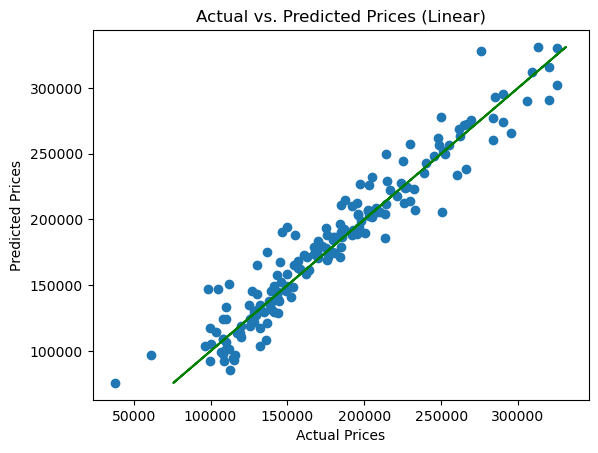

In [39]:
plt.scatter(y_test, linreg_y_pred)
plt.plot(linreg_y_pred,linreg.predict(X_test),color='green')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs. Predicted Prices (Linear)')
plt.show()

Fit untuned Ridge model to training data

In [40]:
Untuned_ridge = Ridge(alpha=0.1, tol=0.0001, max_iter=100)
Untuned_ridge.fit(X_train, y_train)
Untuned_ridge_y_pred = Untuned_ridge.predict(X_test)
Untuned_ridge_acc =  round(Untuned_ridge.score(X_test, y_test)*100,2)
Untuned_ridge_r2 =  round(r2_score(y_test, Untuned_ridge_y_pred)*100,2)
Untuned_ridge_mae = mean_absolute_error(y_test, Untuned_ridge_y_pred)
Untuned_ridge_mse = mean_squared_error(y_test, Untuned_ridge_y_pred)
Untuned_ridge_rmse = np.sqrt(Untuned_ridge_mse)

### 3.1.2 Ridge (Untuned)

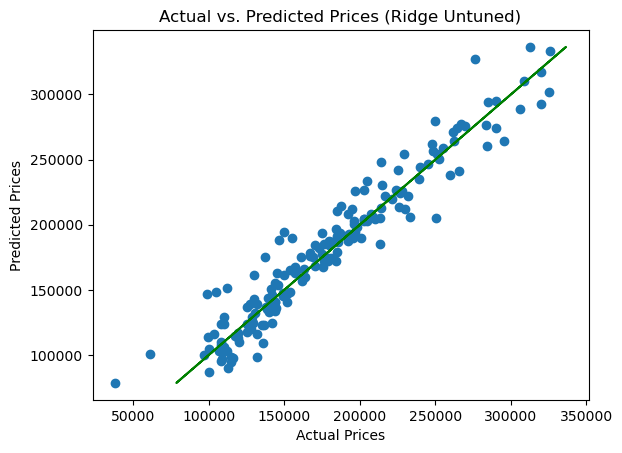

In [41]:
plt.scatter(y_test, Untuned_ridge_y_pred)
plt.plot(Untuned_ridge_y_pred,Untuned_ridge.predict(X_test),color='green')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs. Predicted Prices (Ridge Untuned)')
plt.show()

## 3.2 Tunning hyperparameters using cross-validation with GridSearchCV for Ridge model

In [42]:
from sklearn.model_selection import GridSearchCV

Define the Ridge model

In [43]:
ridge = Ridge()

Define the hyperparameter grid

In [44]:
param_grid = {'alpha': [25,26,27,28,29,30],
              'fit_intercept': [True, False],
              'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg'],
              'max_iter': [12,13,14,15,20],
              'tol': [1e-2,1e-3, 1e-4, 1e-5],
              'random_state': [42]}

Perform grid search cross-validation to find the best hyperparameters

In [45]:
grid_search = GridSearchCV(ridge, param_grid, cv=5, verbose=2, n_jobs=-1)


In [46]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 1200 candidates, totalling 6000 fits


GridSearchCV(cv=5, estimator=Ridge(), n_jobs=-1,
             param_grid={'alpha': [25, 26, 27, 28, 29, 30],
                         'fit_intercept': [True, False],
                         'max_iter': [12, 13, 14, 15, 20], 'random_state': [42],
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr',
                                    'sparse_cg'],
                         'tol': [0.01, 0.001, 0.0001, 1e-05]},
             verbose=2)

Print the best hyperparameters

In [47]:
print("Best hyperparameters:", grid_search.best_params_)

Best hyperparameters: {'alpha': 28, 'fit_intercept': True, 'max_iter': 13, 'random_state': 42, 'solver': 'sparse_cg', 'tol': 0.001}


Train the model using the best hyperparameters

## 3.3 Training Ridge regression model with best hyperparameters

Train the model using the best hyperparameters from GridSearchCV

In [48]:
ridge = Ridge(**grid_search.best_params_)

Fit the model to the training data

In [49]:
ridge.fit(X_train, y_train)

Ridge(alpha=28, max_iter=13, random_state=42, solver='sparse_cg', tol=0.001)

Make predictions on the test set

In [50]:
ridge_y_pred  = ridge.predict(X_test)

In [51]:
import matplotlib.pyplot as plt

Plot predicted vs. actual values on a scatter plot

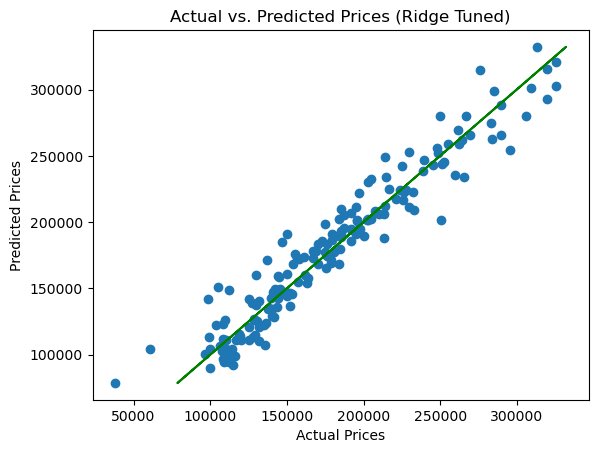

In [52]:
plt.scatter(y_test, ridge_y_pred)
plt.plot(ridge_y_pred,ridge.predict(X_test),color='green')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs. Predicted Prices (Ridge Tuned)')
plt.show()

Determining Accuracy, R^2 Score, mean_absolute_error, mean_squared_error 

In [53]:
ridge_acc = round(ridge.score(X_test, y_test)*100,2)
ridge_r2 =  round(r2_score(y_test, ridge_y_pred)*100,2)
ridge_mae =  round(mean_absolute_error(y_test, ridge_y_pred),2)
ridge_mse =  round(mean_squared_error(y_test, ridge_y_pred),2)
ridge_rmse =  round(np.sqrt(ridge_mse),2)

Displaying Accuracy, R^2 Score, mean_absolute_error, mean_squared_error

In [54]:
print('R^2 Score-->',ridge_r2)
print("Accuracy -->",ridge_acc)
print ('MAE  -->', ridge_mae)
print ('MSE  -->', ridge_mse)
print ('RMSE -->', ridge_rmse)

R^2 Score--> 92.22
Accuracy --> 92.22
MAE  --> 12245.48
MSE  --> 266656836.39
RMSE --> 16329.63


In [55]:
prediction=ridge.predict(test_df)

In [56]:
print(prediction)

[196939.98560044 199506.41486217 172136.94385499 159118.70366471
 184757.26481527 236899.24881484 213667.84098336 158839.15201543
 179365.02092965 192180.03687238 235671.69455076 181418.7618989
 193689.57792773 274791.44980861 217713.70493539 190327.89295866
 267118.38771337 159665.83920558 224309.3908988  135800.82968315
 101710.7874326  128389.87377775  99659.14940117 163367.86401443
 150416.20373276 125899.03381294 107854.7377533  174103.86014964
  92167.7949708  142987.03415534 123593.18918962 175295.39377084
 141100.1726897  148488.08802036 189995.27772624 113640.64950631
 220004.60146245 136146.72642741 119186.01874058  52484.89836168
 251366.77404515 202385.6843454  170466.53176419 157374.60700143
 175296.6694688  171114.56620924 108189.201044   151596.07032631
 118822.07599425 190742.88872862 279149.94440316 202351.47588732
 225840.92719307 172946.75259533 188576.46101757 175876.55800215
 142433.93042439 180563.8152647  177846.82026063 241363.93358084
 229051.05957125 150562.72

## 3.4 Recursive Feature Elimination (RFE) 

To help select the most relevent featrure we made use of Recursive Feature Elimination. 
This is to comfirm that the correct features were choosen and to see if we can get a more accurate score(R^2 Score and Accuracy)

In [57]:
from sklearn.feature_selection import RFE

Create a linear regression model

In [58]:
model = Ridge(**grid_search.best_params_)

Create the RFE object and select 5 features

In [59]:
rfe = RFE(model, n_features_to_select=24)

Throught trial and error 24 was found to have the best scores for R^2 Score and Accuracy and lower mean_absolute_error, mean_squared_error

Fit the RFE object to the training data

In [60]:
rfe.fit(X_train, y_train)

RFE(estimator=Ridge(alpha=28, max_iter=13, random_state=42, solver='sparse_cg',
                    tol=0.001),
    n_features_to_select=24)

Print the selected features

In [61]:
print("Selected Features:")
for i in range(len(rfe.support_)):
    if rfe.support_[i]:
        print(X.columns[i])

Selected Features:
LotArea
YearBuilt
YearRemodAdd
BsmtUnfSF
TotalBsmtSF
1stFlrSF
2ndFlrSF
GrLivArea
Fireplaces
GarageCars
GarageArea
Neighborhood_Somerst
OverallQual_Excellent
OverallQual_Good
OverallQual_Very_Good
OverallCond_Average
OverallCond_Good
MasVnrType_Stone
Foundation_PConc
BsmtQual_Gd
BsmtQual_TA
BsmtFinType1_GLQ
KitchenQual_Gd
KitchenQual_TA


Import libarys to predict data using Ridge

In [62]:
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import RFE

select the top 5 features using RFE

In [63]:
selector = RFE(estimator=Ridge(**grid_search.best_params_), n_features_to_select=24)
selector.fit(X_train, y_train)

RFE(estimator=Ridge(alpha=28, max_iter=13, random_state=42, solver='sparse_cg',
                    tol=0.001),
    n_features_to_select=24)

transform the data to only use the selected features

In [64]:
X_train_rfe = selector.transform(X_train)
X_test_rfe = selector.transform(X_test)

Most optimal Hypermeters

In [65]:
ridge_rfe = Ridge(**grid_search.best_params_)

train the Ridge model with selected features

In [66]:
ridge_rfe.fit(X_train_rfe, y_train)

Ridge(alpha=28, max_iter=13, random_state=42, solver='sparse_cg', tol=0.001)

evaluate model performance with cross-validation

In [67]:
ridge_rfe_y_pred = ridge_rfe.predict(X_test_rfe)

Determining Accuracy, R^2 Score, mean_absolute_error, mean_squared_error

In [68]:
ridge_rfe_acc = round(ridge_rfe.score(X_test_rfe, y_test)*100,2)
ridge_rfe_r2 = round(r2_score(y_test, ridge_rfe_y_pred)*100,2)
ridge_rfe_mae = round(mean_absolute_error(y_test, ridge_rfe_y_pred),2)
ridge_rfe_mse = round(mean_squared_error(y_test, ridge_rfe_y_pred),2)
ridge_rfe_rmse = round(np.sqrt(ridge_rfe_mse),2)

Print Accuracy, R^2 Score, mean_absolute_error, mean_squared_error

In [69]:
print('R^2 Score-->',ridge_rfe_r2)
print("Accuracy -->", ridge_rfe_acc)
print ('MAE  -->', ridge_rfe_mae)
print ('MSE  -->', ridge_rfe_mse)
print ('RMSE -->', ridge_rfe_rmse)

R^2 Score--> 92.54
Accuracy --> 92.54
MAE  --> 11912.73
MSE  --> 255652380.9
RMSE --> 15989.13


Ridge final Ridge model prediction with Hyperparameter and  Recursive Feature Elimination

In [70]:
prediction=ridge.predict(test_df)

In [71]:
print(prediction)

[196939.98560044 199506.41486217 172136.94385499 159118.70366471
 184757.26481527 236899.24881484 213667.84098336 158839.15201543
 179365.02092965 192180.03687238 235671.69455076 181418.7618989
 193689.57792773 274791.44980861 217713.70493539 190327.89295866
 267118.38771337 159665.83920558 224309.3908988  135800.82968315
 101710.7874326  128389.87377775  99659.14940117 163367.86401443
 150416.20373276 125899.03381294 107854.7377533  174103.86014964
  92167.7949708  142987.03415534 123593.18918962 175295.39377084
 141100.1726897  148488.08802036 189995.27772624 113640.64950631
 220004.60146245 136146.72642741 119186.01874058  52484.89836168
 251366.77404515 202385.6843454  170466.53176419 157374.60700143
 175296.6694688  171114.56620924 108189.201044   151596.07032631
 118822.07599425 190742.88872862 279149.94440316 202351.47588732
 225840.92719307 172946.75259533 188576.46101757 175876.55800215
 142433.93042439 180563.8152647  177846.82026063 241363.93358084
 229051.05957125 150562.72

# 4. Gradent boosting

Ridge is a linear regression method, hence we want to compare it to a non-linear regression method to see if there is a non-linear relationship between our dependent and independent variables. 

In [72]:
from sklearn.ensemble import GradientBoostingRegressor

Create an instance of the Gradient Boosting model

In [73]:
gb = GradientBoostingRegressor(n_estimators=100, max_depth=3, learning_rate=0.1, random_state=42)

Fit the model on the training data

In [74]:
gb.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

Make predictions on the testing data

In [75]:
gboost_y_pred = gb.predict(X_test)

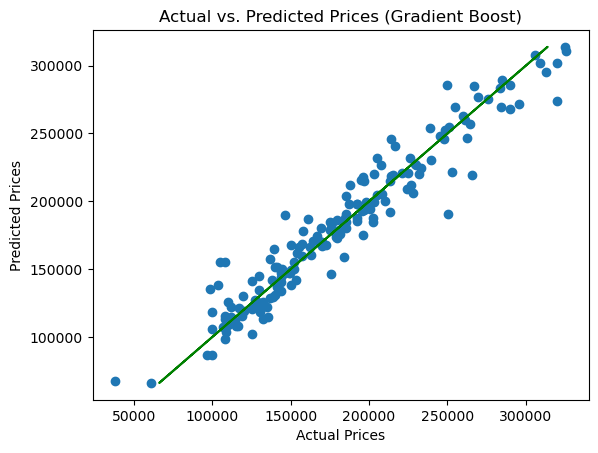

In [76]:
plt.scatter(y_test,gboost_y_pred)
plt.plot(gboost_y_pred,gb.predict(X_test),color='green')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs. Predicted Prices (Gradient Boost)')
plt.show()

Evaluate the performance of the model using the testing data

In [77]:
gboost_acc = round(gb.score(X_test, y_test)*100,2)
gboost_r2 = round(r2_score(y_test, gboost_y_pred)*100,2)
gboost_mae = round(mean_absolute_error(y_test, gboost_y_pred),2)
gboost_mse = round(mean_squared_error(y_test, gboost_y_pred),2)
gboost_rmse = round(np.sqrt(gboost_mse),2)


In [78]:
print('R^2 Score-->',gboost_r2)
print("Accuracy -->",gboost_acc)
print ('MAE  -->', gboost_mae)
print ('MSE  -->', gboost_mse)
print ('RMSE -->', gboost_rmse)

R^2 Score--> 92.99
Accuracy --> 92.99
MAE  --> 10930.55
MSE  --> 240258971.82
RMSE --> 15500.29


prediction for gradient boost

In [79]:
prediction=gb.predict(test_df)

In [80]:
print(prediction)

[199900.68902397 199218.90232697 177569.80684709 166793.80352826
 162363.4162965  256576.70460333 209903.27530577 158553.13742365
 160686.21021813 191936.8445349  236619.46277797 195470.03957012
 183336.43175532 282244.07867109 207218.52919685 184727.87663663
 264089.19203083 156295.12854184 224970.94814265 134056.09250126
 111545.6887607  103130.87789648 113788.35536263 178510.02479063
 148113.76227119 152626.64121738 107628.69098699 163472.07265652
 100250.48018725 136221.14836299 120455.93709755 193273.71716567
 126888.04175668 149222.68059103 184256.75831994 125369.1329117
 254706.66363043 143764.62079302 134326.42165918  55840.39185263
 264494.84566452 211064.14273152 175922.61252038 163394.19164083
 188736.31778483 194397.97411507 123560.69417623 155942.56419733
 120370.85631948 185431.12654098 285663.73085508 202630.91514706
 248054.89618206 169999.0277589  193942.45731561 175193.53674003
 153062.81696189 160263.0224511  163935.30709971 219860.02195352
 233177.47350331 148236.37

# 5. Evaluation

create a table with performance metrics

In [81]:
table_data = {
    'Model': ['Linear Regression', 'Standard Ridge','Tuned Ridge', 'Tuned Ridge with RFE', 'Gradient Boost'],
    'Score/Accuracy': [linreg_acc, ridge_acc,Untuned_ridge_acc, ridge_rfe_acc, gboost_acc],
    'R^2': [linreg_r2, ridge_r2,Untuned_ridge_r2, ridge_rfe_r2, gboost_r2],
    'Mean Absolute Error': [linreg_mae, ridge_mae,Untuned_ridge_mae, ridge_rfe_mae, gboost_mae],
    'Mean Squared Error': [linreg_mse, ridge_mse, Untuned_ridge_mse,ridge_rfe_mse, gboost_mse],
    'Root Mean Squared Error': [linreg_rmse, ridge_rmse,Untuned_ridge_rmse, ridge_rfe_rmse,gboost_rmse]}
results_df = pd.DataFrame(table_data)




Display the results as a table

In [82]:
results_df

,Model,Score/Accuracy,R^2,Mean Absolute Error,Mean Squared Error,Root Mean Squared Error
0,Linear Regression,91.99,91.99,11998.770000,2.744898e+08,16567.730000
1,Standard Ridge,92.22,92.22,12245.480000,2.666568e+08,16329.630000
2,Tuned Ridge,92.06,92.06,11992.719655,2.718070e+08,16486.569851
3,Tuned Ridge with RFE,92.54,92.54,11912.730000,2.556524e+08,15989.130000
4,Gradient Boost,92.99,92.99,10930.550000,2.402590e+08,15500.290000


# 6. Findings

From the above observations we found that Linear Regression gives the lowest metric scores out of all the models used in this document.

We also used the Ridge Model and found some interesting results. When using just the standard Ridge Model we found that the tuned Ridge Model performed less inaccurate in comparison to the Standard Model.

When combining the Tuned Ridge Model with the Recursive Feature Elimination algorithm, it actually increased the performance across all metrics. 

As can be seen Gradient boost had the highest Score/Accuracy and R^2 will also having the 
lowest Mean Absolute Error,Mean Squared Errorand, Root Mean Squared Error out of all models

We can conclude the Recursive Feature Elimination (RFE) and GridSearchCV had a positive effect on prediction indicators but still not as effective as gradient boosting.

The results you are seeing for Gradient boost suggest that there is a non-linear relationship between the dependent and independent variables. Linear regression may not be the best algorithm for this problem, as it is not designed to handle non-linear relationships. Gradient Boost, on the other hand, can handle this type of problem and is likely producing better results in return. Although the Ridge Model with the tuned hyperparameters and RFE technique was close to gradient boost model.